In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv("Dataset .csv")

## RESTAURANTS RATINGS


In [3]:
Aggregate_rating = df["Aggregate rating"]
rating_counts = Aggregate_rating.value_counts().sort_index()

In [4]:
rating_counts

Aggregate rating
0.0    2148
1.8       1
1.9       2
2.0       7
2.1      15
2.2      27
2.3      47
2.4      87
2.5     110
2.6     191
2.7     250
2.8     315
2.9     381
3.0     468
3.1     519
3.2     522
3.3     483
3.4     498
3.5     480
3.6     458
3.7     427
3.8     400
3.9     335
4.0     266
4.1     274
4.2     221
4.3     174
4.4     144
4.5      95
4.6      78
4.7      42
4.8      25
4.9      61
Name: count, dtype: int64

In [5]:
most_common_rating_range = rating_counts.idxmax()
print("Most common rating range: ",most_common_rating_range)

Most common rating range:  0.0


In [6]:
average_votes = df["Votes"].mean()
print("Average number of votes received by restraunts are: ",average_votes)

Average number of votes received by restraunts are:  156.909747670401


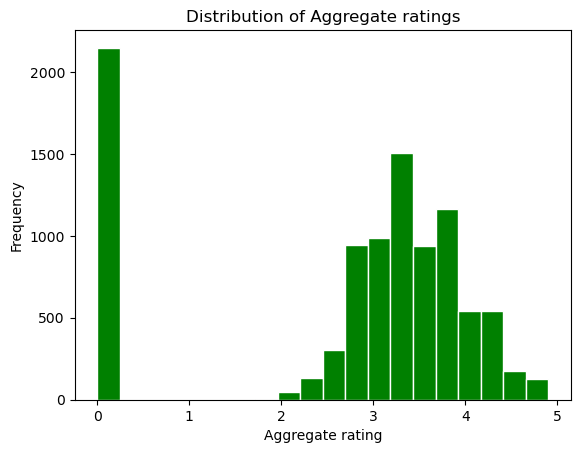

In [7]:
plt.hist(Aggregate_rating , bins = 20,edgecolor = "white" , color="green" )
plt.xlabel("Aggregate rating")
plt.ylabel("Frequency")
plt.title("Distribution of Aggregate ratings")
plt.show()

## CUISINE COMBINATION

In [8]:
cuisines =df["Cuisines"]
aggregate_ratings = df["Aggregate rating"]

In [9]:
cuisines_combination_counts = cuisines.value_counts()

In [10]:
cuisines_combination_counts

Cuisines
North Indian                                             936
North Indian, Chinese                                    511
Chinese                                                  354
Fast Food                                                354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: count, Length: 1825, dtype: int64

In [11]:
most_common_cuisine_combination = cuisines_combination_counts.head(10)


In [12]:
print("Most common cuisine combination: ",most_common_cuisine_combination)

Most common cuisine combination:  Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


In [13]:
cuisine_combination_average_rating = df.groupby("Cuisines")["Aggregate rating"].mean()

In [14]:
cuisine_combination_average_rating

Cuisines
Afghani                                      0.725
Afghani, Mughlai, Chinese                    0.000
Afghani, North Indian                        0.000
Afghani, North Indian, Pakistani, Arabian    0.000
African                                      4.700
                                             ...  
Western, Asian, Cafe                         4.200
Western, Fusion, Fast Food                   3.200
World Cuisine                                4.900
World Cuisine, Mexican, Italian              4.400
World Cuisine, Patisserie, Cafe              4.200
Name: Aggregate rating, Length: 1825, dtype: float64

In [15]:
top_10_average_ratings = cuisine_combination_average_rating.nlargest(10)
print("Average rating for top 10 cuisine combinations: ",top_10_average_ratings)

Average rating for top 10 cuisine combinations:  Cuisines
American, BBQ, Sandwich         4.9
American, Burger, Grill         4.9
American, Caribbean, Seafood    4.9
American, Coffee and Tea        4.9
American, Sandwich, Tea         4.9
BBQ, Breakfast, Southern        4.9
Burger, Bar Food, Steak         4.9
Continental, Indian             4.9
European, Asian, Indian         4.9
European, Contemporary          4.9
Name: Aggregate rating, dtype: float64


## GEOGRAPHIC ANALYSIS

In [28]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

In [29]:
df= pd.read_csv('Dataset .csv')

In [30]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [31]:
if 'Longitude' not in df.columns or 'Latitude' not in df.columns:
    raise ValueError("The dataset must contain 'Longitude' and 'Latitude' columns.")

In [32]:
map_center = [df['Latitude'].mean(), data['Longitude'].mean()]
mymap = folium.Map(location=map_center, zoom_start=12)

In [33]:
marker_cluster = MarkerCluster().add_to(mymap)

In [34]:
for idx, row in df.iterrows():
    if pd.notna(row['Latitude']) and pd.notna(row['Longitude']):
        folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            popup=row['Cuisines']
        ).add_to(marker_cluster)

In [41]:
mymap

## RESTAURANT CHAINS

In [36]:
restaurant_chains = df.groupby("Restaurant Name").size().reset_index(name="Chain Count")
restaurant_chains = restaurant_chains[restaurant_chains["Chain Count"]>1]

In [37]:
restaurant_chains=restaurant_chains.sort_values(by="Chain Count",ascending=False)

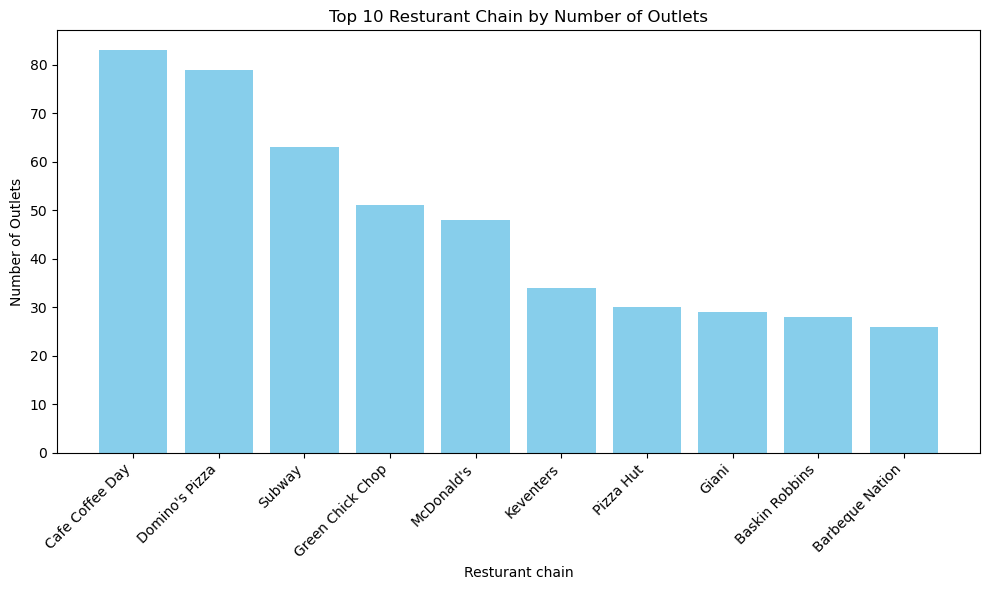

In [39]:
plt.figure(figsize=(10,6))
plt.bar(restaurant_chains["Restaurant Name"][:10],restaurant_chains["Chain Count"][:10],color="skyblue")
plt.xticks(rotation=45,ha="right")
plt.xlabel("Resturant chain")
plt.ylabel("Number of Outlets")
plt.title("Top 10 Resturant Chain by Number of Outlets")
plt.tight_layout()
plt.show()

In [34]:
chain_ratings= df.groupby("Restaurant Name")["Aggregate rating"].mean().reset_index(name="Average Rating")
chain_votes=df.groupby("Restaurant Name")["Votes"].sum().reset_index(name="Total Votes")

In [35]:
chain_analysis = pd.merge(chain_ratings,chain_votes,on="Restaurant Name")
chain_analysis = chain_analysis.sort_values(by="Average Rating", ascending=False)

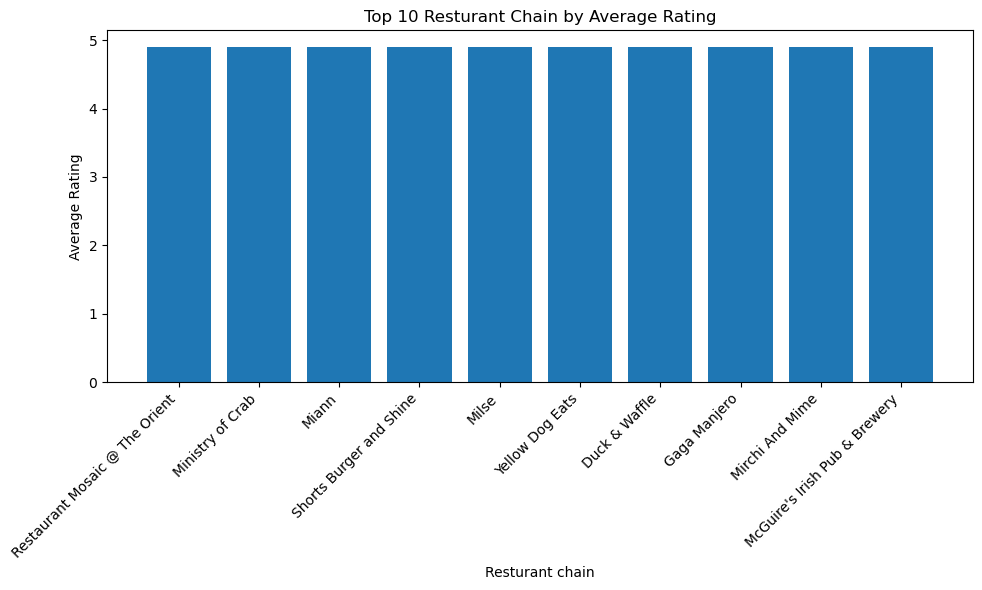

In [36]:
plt.figure(figsize=(10,6))
plt.bar(chain_analysis["Restaurant Name"][:10],chain_analysis["Average Rating"][:10],color=")
plt.xticks(rotation=45,ha="right")
plt.xlabel("Resturant chain")
plt.ylabel("Average Rating")
plt.title("Top 10 Resturant Chain by Average Rating")
plt.tight_layout()
plt.show()